In [2]:
import os
# Seleccio GPUs visibles
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" 
os.environ["CUDA_VISIBLE_DEVICES"]="3,4"

In [3]:
import torch
import torch.optim as optim
import torchvision
from torchvision import transforms
from torchvision.transforms.functional import to_tensor
from torchvision.transforms import Resize
from torch.utils.data import DataLoader
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torch.nn as nn
%cd /tf/detectron2
import detectron2
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog
from detectron2.data import transforms as T
from detectron2.utils.logger import setup_logger
setup_logger()
from PIL import Image, ImageDraw
from scipy.optimize import linear_sum_assignment
import torch.nn.functional as F
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import json
from torchviz import make_dot
import copy
from sklearn.metrics import precision_recall_fscore_support

/tf/detectron2


In [34]:
# xmin, ymin, xmax, ymax to xmin, ymin, w, h
def xyxy_to_xywh(coordenadas, clamp=False):
    coordenadas = torch.stack((coordenadas[:, 0],
                               coordenadas[:, 1],
                               coordenadas[:, 2] - coordenadas[:, 0],
                               coordenadas[:, 3] - coordenadas[:, 1]
                               ), dim=1)
    if clamp:
        coordenadas = torch.clamp(coordenadas, min=0, max=1)
    return coordenadas

# xmin, ymin, w, h to xmin, ymin, xmax, ymax
def xywh_to_xyxy(coordenadas, clamp=False):
    coordenadas = torch.stack((coordenadas[:, 0], 
                               coordenadas[:, 1], 
                               coordenadas[:, 0] + coordenadas[:, 2],
                               coordenadas[:, 1] + coordenadas[:, 3]
                               ), dim=1)
    if clamp:
        coordenadas = torch.clamp(coordenadas, min=0, max=1)    
    return coordenadas

# cx, cy, w, h to xmin, ymin, xmax, ymax
def cxcywh_to_xyxy(coordenadas, clamp=False):
    coordenadas = torch.stack((coordenadas[:, 0] - coordenadas[:, 2] / 2,
                               coordenadas[:, 1] - coordenadas[:, 3] / 2,
                               coordenadas[:, 0] + coordenadas[:, 2] / 2,
                               coordenadas[:, 1] + coordenadas[:, 3] / 2
                               ), dim=1)
    if clamp:
        coordenadas = torch.clamp(coordenadas, min=0, max=1)    
    return coordenadas

# xmin, ymin, xmax, ymax to cx, cy, w, h
def xyxy_to_cxcywh(coordenadas, clamp=False):
    coordenadas = torch.stack(((coordenadas[:, 0] + coordenadas[:, 2]) / 2,
                               (coordenadas[:, 1] + coordenadas[:, 3]) / 2,
                               coordenadas[:, 2] - coordenadas[:, 0],
                               coordenadas[:, 3] - coordenadas[:, 1]
                               ), dim=1)
    if clamp:
        coordenadas = torch.clamp(coordenadas, min=0, max=1)    
    return coordenadas

# cx, cy, w, h to xmin, ymin, w, h
def cxcywh_to_xywh(coordenadas, clamp=False):
    coordenadas = torch.stack((coordenadas[:, 0] - coordenadas[:, 2] / 2,
                               coordenadas[:, 1] - coordenadas[:, 3] / 2,
                               coordenadas[:, 2],
                               coordenadas[:, 3]
                               ), dim=1)
    if clamp:
        coordenadas = torch.clamp(coordenadas, min=0, max=1)    
    return coordenadas

In [5]:
class PoolDetectionModel(nn.Module):
    def __init__(self, num_classes, num_predictions = 100):
        super(PoolDetectionModel, self).__init__()
        
        # Cargamos el modelo pre-entrenado
        self.model = torch.hub.load('facebookresearch/detr:main', 'detr_resnet50', pretrained=True)

        # Cambiamos el número de clases de salida
        hidden_dim = self.model.transformer.d_model
        self.model.num_classes = num_classes
        self.model.class_embed = nn.Linear(hidden_dim, num_classes)
        
#         if num_predictions != False:
          # Cambiamos el número predicciones
#         num_query = self.model.transformer.d_model
#         self.model.query_embed = nn.Sequential(nn.Embedding(num_predictions, num_query),
#                                                  nn.Sigmoid()
#                                                 )
                
    def forward(self, x):
        # Pasamos las imágenes por el modelo pre-entrenado
        outputs = self.model(x)
        
        # Obtenemos las cajas y las etiquetas de las predicciones
        outputs['pred_logits'] = torch.sigmoid(outputs['pred_logits'])
        
        # Devolvemos las cajas y las etiquetas
        return outputs

In [6]:
def declarar_modelo(paths, paramaters, Load_model = False):
    # Calculate current number of test
    current_test = get_current_test(paths["tests"])
    if Load_model:
        # Load model
        model = PoolDetectionModel(num_classes=paramaters["num_classes"], num_predictions = paramaters["num_predictions"])
        # Path to current test
        path_current_test = f'{paths["tests"]}test {current_test}/'
        paths["test"] = path_current_test
        # Calculate current epoch in test
        current_epoch = get_current_epoch(path_current_test)
        # Load model parameters
        model = torch.load(f'{path_current_test}model_{current_epoch}.pt')
        # Get previus losses
        with open(f"{path_current_test}model_loss_{current_epoch}.json", 'r') as f:
            train_loss = json.load(f)
        with open(f"{path_current_test}parameters.json", 'r') as f:
            paramaters = json.load(f)
        paramaters["current_epoch"] = current_epoch+1
        print(f"Load model {path_current_test}model_{current_epoch}.pt")
        print(f"Load parameters {paramaters}")
    else:
        # Create list of losses
        train_loss = []
        # Load model
        model = PoolDetectionModel(num_classes=paramaters["num_classes"])#, num_predictions = paramaters["num_predictions"])
        # Path to new test
        path_current_test = f'{paths["tests"]}test {current_test+1}/'
        # Create directori of the new test
        os.makedirs(path_current_test)
        # Save parameters
        with open(f"{path_current_test}parameters.json", 'w') as f:
            json.dump(paramaters, f)
        paths["test"] = path_current_test
        paramaters["current_epoch"] = 1
        print("New Model")
        print(path_current_test)
        print(f"Parameters {paramaters}")
    return model, paramaters, train_loss

def get_current_epoch(path):
    list_names = os.listdir(path)
    list_names = [int(namefile[6:-3]) for namefile in list_names if namefile.endswith(".pt")]
    return max(list_names)

def get_current_test(path):
    list_tests = sorted(os.listdir(path))
    list_tests.pop(0)
    list_tests = [int(namefile[5:]) for namefile in list_tests]
    return max(list_tests)

In [7]:
def collate_fn(batch):
    images = []
    targets = []
    # Define the normalization transform
    resize = transforms.Resize(new_size, antialias=None)
    normalize = transforms.Normalize(mean=[0.53016539, 0.48067732, 0.410102], std=[0.25151319, 0.2374013, 0.23417556])
    transform = transforms.Compose([transforms.ToTensor(), resize, normalize])
    for sample in batch:
        image = Image.open(sample['file_name']).convert('RGB')
        width, height = image.size
        # Transformar la imagen
        image = transform(image)
        # Adaptar las anotaciones
        annotations = copy.deepcopy(sample['annotations'])
        for ann in annotations:
            bbox = ann['bbox']
            x_original, y_original, w_original, h_original = bbox
            x_new = x_original / width #* new_size[1]
            y_new = y_original / height #* new_size[0]
            w_new = w_original / width #* new_size[1]
            h_new = h_original / height #* new_size[0]
            ann['bbox'] = [x_new, y_new, w_new, h_new]
#             print(ann['bbox'])
        
        # Añadir la imagen y las anotaciones a la lista
        if len(annotations) != 0:
            images.append(image)
            targets.append({'boxes': [ann['bbox'] for ann in annotations], 'labels': [1 for ann in annotations if ann['category_id'] == 0]})
    return images, targets

In [8]:
def train(model, optimizer, data_loader, device, losses, epochs, current_epoch):
    model.train()

    for name, param in model.named_parameters():
        if "class_embed" not in name and "bbox_embed" not in name:
            param.requires_grad = False
        else:
            print("No congelando:", name)
    for epoch in range(current_epoch, epochs):
        print("\nEpoch:", epoch, "\n")
        loss_epoch = []
        for images_, targets_ in tqdm(data_loader):
            images = copy.deepcopy(images_)
            targets = copy.deepcopy(targets_)
            images = [image.to(device) for image in images]
            targets = [{k: v for k, v in t.items()} for t in targets]
            optimizer.zero_grad()
            output = model(images)
            loss = hungarian_loss_2(output, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm = 0.1, norm_type = 2)
#             make_dot(loss, params=dict(model.named_parameters()), show_attrs=True, show_saved=True).render('graph', format='pdf', directory='/tf')
#             return
            optimizer.step()
#             scheduler.step()
            loss = loss.item()/len(images)
            loss_epoch.append(loss)
#           if len(losses) > 2 and abs(losses[-1] - losses[-2]) < 10**-6:
#             return
        losses = losses+loss_epoch
        torch.save(model, f"{paths['test']}model_{epoch}.pt")
        with open(f"{paths['test']}model_loss_{epoch}.json", 'w') as f:
            json.dump(losses, f)
        paramaters["current_epoch"] = epoch+1
        print(" Model saved")
        print("loss:", loss)
        print(cxcywh_to_xyxy(output["pred_boxes"][0])[0])

    return


In [9]:
def hungarian_loss_2(outputs, targets):
    # reorder outputs and targets based in the hungarian algorithm without breaking the computation graph
    # outputs are the predicted bounding boxes and labels in the format ([batch_size, num_queries, 4], [batch_size, num_queries, num_classes])
    # targets are the ground truth bounding boxes and labels in the format [{'boxes': [x1, y1, x2, y2], 'labels': [0, 1, 2, 3]}, {'boxes': [x1, y1, x2, y2], 'labels': [0, 1, 2, 3]}]
    # the loss is calculated as the sum of the l1 loss, the iou loss and the classification loss    
    # convert the targets to the same format as the outputs
    true_boxes = [torch.tensor(target['boxes'], dtype=torch.float32).to(device) for target in targets]
    true_labels = [torch.tensor(target['labels'], dtype=torch.float32).to(device) for target in targets]
    
    l1 = 0
    iou = 0
    classification = 0
    
    for n in range(len(true_boxes)):
        row_ind, col_ind = hungarian((xywh_to_xyxy(true_boxes[n]), true_labels[n]), (cxcywh_to_xyxy(outputs["pred_boxes"][n]), outputs['pred_logits'][n]))
        # Calculate the losses
        p_boxes = cxcywh_to_xyxy(outputs["pred_boxes"][n][row_ind])
        t_boxes = xywh_to_xyxy(true_boxes[n][col_ind])
        mask_row = torch.ones(outputs['pred_logits'][n].shape, dtype=torch.bool)
        mask_row[row_ind] = False
        p_label = torch.cat((outputs['pred_logits'][n][row_ind], outputs['pred_logits'][n][mask_row].unsqueeze(1)), 0)
        t_label = torch.cat((true_labels[n][col_ind].unsqueeze(1), torch.zeros(p_label.shape[0]-len(col_ind)).to(device).unsqueeze(1)))
        l1 = l1 + torch.nn.functional.l1_loss(p_boxes, t_boxes)
        # iou = torchvision.ops.complete_box_iou_loss(pred_boxes, true_boxes, reduction = "mean")
#         print(cxcywh_to_xyxy(outputs["pred_boxes"][n][row_ind])[0], xywh_to_xyxy(true_boxes[n][col_ind])[0])
        iou = iou + torchvision.ops.generalized_box_iou_loss(p_boxes, t_boxes, reduction = "mean")
        classification = classification + torch.nn.functional.binary_cross_entropy(p_label, t_label)

    # Combinamos las losses
    l1_weight, iou_weight, classification_weight = 5, 2, 2
    loss = l1_weight * l1 + iou_weight * iou + classification_weight * classification    
    return loss

def hungarian(true, pred):
    true_boxes, true_labels = true
    boxes, labels = pred
    
    true_labels = true_labels.unsqueeze(1)
    
    # Calculamos el costo de emparejamiento entre las cajas predichas y verdaderas
    cost_boxes = torch.cdist(boxes, true_boxes, p=1)
    
    # Calculamos el costo de emparejamiento entre las etiquetas predichas y verdaderas
    cost_labels = torch.cdist(labels, true_labels, p=1)
    
    # Combinamos los costos
    cost = cost_boxes + cost_labels
    
    # Resolvemos el problema de asignación lineal
    row_ind, col_ind = linear_sum_assignment(cost.cpu().detach().numpy())
    
    return row_ind, col_ind

In [10]:
def collate_fn_memoria(batch):
    images = []
    targets = []
    for sample in batch:
        if sample["image_id"] < len(list_images):
            images.append(list_images[sample["image_id"]-1])
            targets.append(list_targets[sample["image_id"]-1])
    return images, targets

In [11]:
def Cargar_dataset_memoria(dataset, batch_size):
    images = []
    targets = []
    resize = transforms.Resize(new_size, antialias=None)
    normalize = transforms.Normalize(mean=[0.53016539, 0.48067732, 0.410102], std=[0.25151319, 0.2374013, 0.23417556])
    transform = transforms.Compose([transforms.ToTensor(), resize, normalize])
    for sample in tqdm(dataset):
        # Define the normalization transform
        image = Image.open(sample['file_name']).convert('RGB')
        width, height = image.size
        # Transformar la imagen
        image = transform(image)
        # Adaptar las anotaciones
        annotations = sample['annotations']
        for ann in annotations:
            bbox = ann['bbox']
            x_original, y_original, w_original, h_original = bbox
            x_new = x_original / width #* new_size[1]
            y_new = y_original / height #* new_size[0]
            w_new = w_original / width #* new_size[1]
            h_new = h_original / height #* new_size[0]
            ann['bbox'] = [x_new, y_new, w_new, h_new]
        # Añadir la imagen y las anotaciones a la lista
        if len(annotations) != 0:
            images.append(image)
            targets.append({'boxes': [ann['bbox'] for ann in annotations], 'labels': [1 for ann in annotations if ann['category_id'] == 0]})
    return images, targets

In [12]:
path_dataset = "/tf/data/tmp/PoolsDS/"
paths = {"dataset": f"{path_dataset}",
         "tests": f"{path_dataset}tests/",
         "annotations_train": f"{path_dataset}annotations_4_recounted_train.json",
         "annotations_test": f"{path_dataset}annotations_4_recounted_test.json",
         "images": f"{path_dataset}images"
         }

paramaters = {"learning_rate": 10**(-3),
              "momentum": 0.9,
              "batch_size": 4,
              "epochs": 100, 
              "num_classes": 1,
              "num_predictions": 100,
              "weight_decay": 10**(-4)
              }


Load_model = False
new_size = (700, 700)

# Declarar el modelo 
model, paramaters, train_loss = declarar_modelo(paths, paramaters, Load_model = Load_model)

# Declarar el optimizador
# optimizer = optim.SGD(model.parameters(), lr=paramaters["learning_rate"], momentum=paramaters["momentum"])
optimizer = optim.AdamW(model.parameters(), lr=paramaters["learning_rate"], weight_decay=paramaters["weight_decay"])

# Declarar el scheduler
# scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=paramaters["learning_rate"], max_lr=paramaters["max_lr"], cycle_momentum=False)
scheduler = None
print("Comprobando device")
# Declarar el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Utilizando :", device)

# Mover el modelo y el DataLoader al dispositivo
model.to(device);

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


New Model
/tf/data/tmp/PoolsDS/tests/test 96/
Parameters {'learning_rate': 0.001, 'momentum': 0.9, 'batch_size': 4, 'epochs': 100, 'num_classes': 1, 'num_predictions': 100, 'weight_decay': 0.0001, 'current_epoch': 1}
Comprobando device
Utilizando : cuda


In [13]:
DatasetCatalog.clear()
MetadataCatalog.clear()

print("Load data")
# Registrar instancia de COCO
register_coco_instances("piscinas_entrenamiento", {}, paths["annotations_train"], paths["images"])
# Cargar la instancia de COCO como un objeto Dataset
dataset_name = "piscinas_entrenamiento"
dataset = DatasetCatalog.get(dataset_name)
# Obtener metadatos del dataset
metadata = MetadataCatalog.get(dataset_name)
# Cargar datos a memoria
print("Cargando datos en memoria")
list_images, list_targets = Cargar_dataset_memoria(dataset, paramaters["batch_size"])
# Declarar el DataLoader
data_loader_train = DataLoader(dataset, batch_size=paramaters["batch_size"], collate_fn=collate_fn_memoria, shuffle=True)

Load data
WARNING [05/29 20:22:35 d2.data.datasets.coco]: /tf/data/tmp/PoolsDS/annotations_4_recounted_train.json contains 101310 annotations, but only 101299 of them match to images in the file.
[05/29 20:22:35 d2.data.datasets.coco]: Loaded 12654 images in COCO format from /tf/data/tmp/PoolsDS/annotations_4_recounted_train.json
Cargando datos en memoria


100%|██████████| 12654/12654 [05:40<00:00, 37.20it/s]


In [14]:
# Declarar el DataLoader
data_loader_train = DataLoader(dataset, batch_size=paramaters["batch_size"], collate_fn=collate_fn_memoria, shuffle=True)

In [ ]:
print("Training begin")
train(model, optimizer, data_loader_train, device, train_loss, paramaters["epochs"], paramaters["current_epoch"])

Training begin
No congelando: model.class_embed.weight
No congelando: model.class_embed.bias
No congelando: model.bbox_embed.layers.0.weight
No congelando: model.bbox_embed.layers.0.bias
No congelando: model.bbox_embed.layers.1.weight
No congelando: model.bbox_embed.layers.1.bias
No congelando: model.bbox_embed.layers.2.weight
No congelando: model.bbox_embed.layers.2.bias

Epoch: 24 



100%|██████████| 3164/3164 [07:54<00:00,  6.67it/s]


 Model saved
loss: 2.4176058769226074
tensor([-0.0043,  0.7107,  0.1325,  0.8868], device='cuda:0',
       grad_fn=<SelectBackward0>)

Epoch: 25 



100%|██████████| 3164/3164 [07:58<00:00,  6.62it/s]


 Model saved
loss: 1.9502238035202026
tensor([0.0493, 0.3198, 0.3183, 0.6404], device='cuda:0',
       grad_fn=<SelectBackward0>)

Epoch: 26 



100%|██████████| 3164/3164 [08:00<00:00,  6.58it/s]


 Model saved
loss: 2.2722997665405273
tensor([0.0466, 0.7382, 0.2670, 0.9728], device='cuda:0',
       grad_fn=<SelectBackward0>)

Epoch: 27 



100%|██████████| 3164/3164 [07:55<00:00,  6.65it/s]


 Model saved
loss: 2.5575778484344482
tensor([0.0811, 0.8007, 0.1640, 0.8863], device='cuda:0',
       grad_fn=<SelectBackward0>)

Epoch: 28 



 28%|██▊       | 893/3164 [02:15<05:18,  7.13it/s]

In [60]:
for images_, targets_ in tqdm(data_loader_train):
#     images = copy.deepcopy(images_)
#     targets = copy.deepcopy(targets_)
    print(images_)
    print(targets_)

  1%|          | 23/3164 [00:00<00:27, 115.49it/s]

[tensor([[[ 1.2599,  1.4471,  1.1040,  ..., -1.1568, -0.6423, -0.9385],
         [ 1.2911,  1.4626,  1.5718,  ..., -1.0477, -0.8450, -1.1724],
         [ 1.2911,  1.4003,  1.5562,  ..., -0.8138, -1.1256, -1.1412],
         ...,
         [-1.7649, -1.6713, -1.8428,  ..., -1.3907, -1.2815, -1.2036],
         [-1.2503, -1.4686, -1.4998,  ..., -1.4686, -1.1256, -1.1100],
         [-1.0788, -0.7514, -0.2057,  ..., -0.6267, -0.3616, -0.6579]],

        [[ 0.8330,  1.0147,  0.6183,  ..., -1.2153, -0.7528, -1.1327],
         [ 0.8495,  1.0312,  1.0643,  ..., -1.0501, -0.9841, -1.3475],
         [ 0.8165,  0.8991,  1.0312,  ..., -0.7858, -1.2484, -1.2814],
         ...,
         [-1.4631, -1.3640, -1.5787,  ..., -1.3475, -1.2649, -1.1823],
         [-0.9180, -1.1493, -1.2318,  ..., -1.4136, -1.0832, -1.0667],
         [-0.7363, -0.3894,  0.1392,  ..., -0.5215, -0.2738, -0.5876]],

        [[ 0.5597,  0.7439,  0.3755,  ..., -1.1651, -0.7297, -1.1316],
         [ 0.5765,  0.7607,  0.8444,  ..., -

  2%|▏         | 48/3164 [00:00<00:26, 116.07it/s]

[tensor([[[-1.0632, -0.9541, -1.2192,  ...,  1.0884,  0.9481,  1.0261],
         [-1.1568, -0.9697, -1.0477,  ...,  0.6051,  0.7142,  0.7298],
         [-1.2971, -0.9073, -0.8761,  ...,  0.5427,  0.5739,  0.6830],
         ...,
         [ 1.1664,  1.1820,  0.7454,  ...,  0.7454,  0.9013,  0.4180],
         [ 0.8857,  0.8390,  0.7922,  ...,  0.5115,  0.9169,  0.6675],
         [ 0.6363,  0.7298,  0.9481,  ..., -0.8450, -0.1745, -0.0810]],

        [[-1.0171, -0.9015, -1.1823,  ...,  0.7174,  0.5522,  0.6348],
         [-1.1162, -0.9180, -1.0006,  ...,  0.2053,  0.3044,  0.3209],
         [-1.2153, -0.8024, -0.7693,  ...,  0.1392,  0.1557,  0.2714],
         ...,
         [ 0.7339,  0.7504,  0.2879,  ...,  0.2548,  0.3870, -0.1086],
         [ 0.4531,  0.4035,  0.3374,  ...,  0.1722,  0.6017,  0.3374],
         [ 0.1888,  0.2879,  0.5026,  ..., -1.1823, -0.4720, -0.3729]],

        [[-0.9642, -0.8470, -1.1316,  ...,  0.3755,  0.2583,  0.3420],
         [-1.0647, -0.8637, -0.9474,  ..., -

  2%|▏         | 72/3164 [00:00<00:26, 115.49it/s]

[tensor([[[-0.3928,  1.3847,  1.5562,  ..., -0.3616, -0.9229, -0.3616],
         [-0.8917,  1.0728,  1.5874,  ..., -0.6423, -1.4686, -1.2815],
         [-0.8606,  0.9637,  1.7277,  ..., -0.6267, -1.3127, -1.0788],
         ...,
         [ 1.1040,  1.1976,  1.3847,  ...,  0.0750, -0.2681, -0.4863],
         [ 1.0417,  1.1820,  1.3223,  ..., -0.1121, -0.1121, -1.0632],
         [ 1.2288,  1.4003,  1.3067,  ...,  0.2621,  0.0594, -1.2659]],

        [[-0.2407,  1.6424,  1.8406,  ..., -0.2572, -0.8354, -0.2407],
         [-0.7693,  1.3286,  1.8737,  ..., -0.5546, -1.4136, -1.2153],
         [-0.7032,  1.2129,  2.0058,  ..., -0.5546, -1.2814, -1.0336],
         ...,
         [ 1.3451,  1.4607,  1.6424,  ..., -0.0260, -0.3564, -0.6041],
         [ 1.3286,  1.4937,  1.5929,  ..., -0.2242, -0.1912, -1.1823],
         [ 1.5433,  1.7250,  1.5763,  ...,  0.1722, -0.0095, -1.3970]],

        [[-0.3278,  1.6147,  1.8659,  ..., -0.3278, -0.9642, -0.3613],
         [-0.8637,  1.2966,  1.8994,  ..., -

  3%|▎         | 98/3164 [00:00<00:25, 120.89it/s]

[tensor([[[ 1.3379,  1.2755,  0.9169,  ..., -1.7493, -1.4530, -1.1568],
         [ 0.9637,  1.1196,  0.8390,  ..., -1.7649, -1.3127, -1.0165],
         [ 0.9793,  1.2444,  0.9169,  ..., -1.8117, -1.2971, -1.0944],
         ...,
         [-0.4240, -1.0788, -1.5154,  ..., -1.4686, -1.3907, -1.0321],
         [ 0.1373, -0.4708, -0.5955,  ..., -1.3907, -1.4998, -1.5622],
         [ 0.7922,  0.4336,  0.2309,  ..., -1.4375, -1.7181, -1.7805]],

        [[ 0.5026,  0.4365, -0.0095,  ..., -1.7109, -1.4301, -1.1658],
         [ 0.1062,  0.2218, -0.0921,  ..., -1.7274, -1.2814, -1.0171],
         [ 0.0731,  0.3540, -0.0095,  ..., -1.7770, -1.2649, -1.0997],
         ...,
         [-0.2903, -0.9841, -1.4466,  ..., -1.4796, -1.4136, -1.0171],
         [ 0.3374, -0.3068, -0.4555,  ..., -1.4136, -1.5292, -1.5953],
         [ 1.0312,  0.6513,  0.4200,  ..., -1.4631, -1.7604, -1.8265]],

        [[ 0.4592,  0.3588, -0.0766,  ..., -1.4833, -1.1484, -0.8637],
         [ 0.0573,  0.1578, -0.1939,  ..., -

  4%|▍         | 124/3164 [00:01<00:24, 122.23it/s]

[tensor([[[ 1.5094,  1.3691,  0.4180,  ...,  1.8680,  1.8680,  1.8680],
         [ 1.4782,  0.7922, -0.3616,  ...,  1.8680,  1.8213,  1.6653],
         [ 1.0105, -0.3772, -1.1724,  ...,  1.7901,  1.5250,  0.4804],
         ...,
         [-0.8138, -0.8138, -0.6267,  ...,  1.6186,  1.2755,  0.8390],
         [-1.2971, -0.6267, -0.5019,  ...,  1.4626,  1.7589,  0.9325],
         [-1.1880, -1.1880, -1.2815,  ...,  0.3712,  1.4315,  1.0261]],

        [[ 1.1799,  1.0808,  0.1392,  ...,  2.1215,  2.0554,  2.0554],
         [ 1.1799,  0.5026, -0.6702,  ...,  2.1545,  2.0058,  1.8076],
         [ 0.7669, -0.6702, -1.4631,  ...,  1.9397,  1.6259,  0.5191],
         ...,
         [-0.6041, -0.6041, -0.4389,  ...,  1.6589,  1.2460,  0.7669],
         [-1.1162, -0.4059, -0.3068,  ...,  1.5103,  1.7580,  0.8991],
         [-1.0006, -1.0006, -1.1327,  ...,  0.3540,  1.4607,  0.9982]],

        [[ 0.8947,  0.8612, -0.0264,  ...,  2.0501,  1.9999,  1.9999],
         [ 0.9281,  0.2583, -0.8135,  ...,  

  5%|▍         | 150/3164 [00:01<00:25, 119.22it/s]

[tensor([[[ 0.9325,  1.6497,  1.3847,  ..., -0.8917, -1.2659, -1.2815],
         [ 0.8390,  1.0417,  0.3712,  ..., -0.7826, -1.2503, -1.4842],
         [ 1.5094,  0.3712, -0.7514,  ..., -1.1568, -1.2503, -1.2192],
         ...,
         [ 0.6830,  0.3868,  0.3868,  ...,  1.6809,  1.7589,  1.4315],
         [ 1.0417,  0.7454,  0.7610,  ...,  1.1040,  1.4471,  1.7589],
         [ 0.7454,  0.7766,  0.9325,  ...,  0.8390,  0.7922,  1.6497]],

        [[ 0.9651,  1.7250,  1.4442,  ..., -0.7032, -1.0997, -1.1162],
         [ 0.8660,  1.0808,  0.3705,  ..., -0.5876, -1.0832, -1.3310],
         [ 1.5929,  0.3870, -0.8024,  ..., -1.0171, -1.1162, -1.0832],
         ...,
         [ 0.8991,  0.5852,  0.5852,  ...,  1.8076,  1.8902,  1.5433],
         [ 1.2460,  0.9321,  0.9486,  ...,  1.1964,  1.5598,  1.8902],
         [ 0.9321,  0.9651,  1.1303,  ...,  0.9156,  0.8660,  1.7746]],

        [[ 1.0956,  1.8659,  1.5813,  ..., -0.5958, -0.9977, -1.0144],
         [ 0.9951,  1.2128,  0.4927,  ..., -

  6%|▌         | 177/3164 [00:01<00:23, 126.10it/s]

[tensor([[[-1.2659, -1.3595, -1.1256,  ..., -1.6090, -1.4686, -1.6246],
         [-1.8584, -1.9364, -1.7493,  ..., -1.4998, -1.5154, -1.7649],
         [-1.8117, -1.7181, -1.7181,  ..., -1.5154, -1.8117, -1.6713],
         ...,
         [-1.7649, -1.3127, -0.8917,  ..., -0.7982, -0.6890, -1.4063],
         [-1.6869, -0.9853, -0.6423,  ..., -0.8294, -0.4552, -0.9073],
         [-1.7649, -0.9385, -0.8138,  ..., -1.1100, -0.4552, -0.7670]],

        [[-0.6537, -0.8024, -0.6372,  ..., -1.4961, -1.3475, -1.5127],
         [-1.3970, -1.5127, -1.3475,  ..., -1.3805, -1.3970, -1.6613],
         [-1.5127, -1.4466, -1.4796,  ..., -1.4466, -1.7604, -1.6118],
         ...,
         [-1.7274, -1.2484, -0.8024,  ..., -0.7198, -0.5711, -1.2814],
         [-1.6448, -0.9015, -0.5215,  ..., -0.7528, -0.3233, -0.8024],
         [-1.7274, -0.8354, -0.7032,  ..., -1.0501, -0.3564, -0.6537]],

        [[-0.3948, -0.5288, -0.3278,  ..., -1.4163, -1.2656, -1.4331],
         [-1.1484, -1.2489, -1.0647,  ..., -

  7%|▋         | 208/3164 [00:01<00:21, 139.26it/s]

[tensor([[[ 1.5718,  1.7589,  1.5718,  ..., -0.6267, -0.6423, -0.3928],
         [ 1.4003,  1.5562,  1.6030,  ..., -0.2525, -0.5331, -0.1745],
         [ 1.3067,  1.4471,  1.6497,  ..., -0.2837, -0.7826, -0.5799],
         ...,
         [-1.1100, -0.3772, -1.1568,  ...,  0.4180,  0.5583,  0.2621],
         [-1.4686, -0.0342,  0.0594,  ...,  0.2309,  0.6675,  0.1217],
         [-1.5154, -0.3616,  1.0573,  ...,  0.4492,  0.9637,  0.3088]],

        [[ 1.5103,  1.7085,  1.5103,  ..., -0.5215, -0.4885, -0.2077],
         [ 1.3286,  1.4937,  1.5433,  ..., -0.1251, -0.3729,  0.0236],
         [ 1.2460,  1.3946,  1.5929,  ..., -0.1581, -0.6372, -0.4224],
         ...,
         [-1.1493, -0.3729, -1.1658,  ...,  0.2714,  0.4696,  0.1557],
         [-1.4961,  0.0236,  0.1227,  ...,  0.1227,  0.5852,  0.0071],
         [-1.5457, -0.3233,  1.1799,  ...,  0.3540,  0.8991,  0.2053]],

        [[ 1.4808,  1.6817,  1.4808,  ..., -0.2776, -0.2776, -0.0431],
         [ 1.2966,  1.4640,  1.5143,  ...,  

  8%|▊         | 239/3164 [00:01<00:20, 145.26it/s]

[tensor([[[-1.5466, -1.5622, -1.5622,  ...,  1.4003,  1.4003,  1.6653],
         [-1.5622, -1.5778, -1.5466,  ...,  1.2599,  1.4938,  1.5718],
         [-1.5310, -1.5466, -1.5154,  ...,  1.0105,  1.0728,  1.0261],
         ...,
         [-1.0009, -0.5955, -0.4552,  ..., -1.3907, -1.2971, -1.4219],
         [-0.6734, -0.3772, -0.4552,  ..., -1.0788, -0.7982, -1.2815],
         [-0.7826, -0.7514, -1.0632,  ..., -1.1412, -0.7982, -1.5154]],

        [[-1.4631, -1.4796, -1.5292,  ...,  1.5433,  1.5103,  1.7911],
         [-1.4796, -1.4961, -1.5127,  ...,  1.3946,  1.5929,  1.6755],
         [-1.4631, -1.4631, -1.4796,  ...,  1.1469,  1.1799,  1.1469],
         ...,
         [-1.0006, -0.5711, -0.4059,  ..., -1.2979, -1.2484, -1.3805],
         [-0.6537, -0.3398, -0.4224,  ..., -0.9675, -0.7032, -1.2153],
         [-0.7693, -0.7363, -1.0667,  ..., -1.0336, -0.7032, -1.4631]],

        [[-1.0982, -1.1484, -1.1819,  ...,  1.5813,  1.5310,  1.8157],
         [-1.1149, -1.1316, -1.1651,  ...,  

  9%|▊         | 270/3164 [00:02<00:19, 146.36it/s]

[tensor([[[-0.8917,  0.9013,  1.1664,  ..., -0.0186,  0.3400,  0.1685],
         [-0.0342,  1.3067,  0.3868,  ..., -0.5643, -0.7202, -0.8138],
         [ 0.4336,  1.2288, -0.9385,  ..., -1.3595, -1.0477, -0.6579],
         ...,
         [-0.8606, -0.7670, -0.9541,  ...,  0.9949,  1.0105,  0.8390],
         [-0.7826, -0.7358, -0.6579,  ...,  1.0417,  1.1352,  0.9169],
         [-0.8450, -0.8761, -0.6579,  ...,  0.7766,  0.6051,  0.5271]],

        [[-1.1658,  0.7008,  0.9651,  ..., -0.0260,  0.3044,  0.1392],
         [-0.2572,  1.1303,  0.1062,  ..., -0.6207, -0.8024, -0.9180],
         [ 0.2053,  1.0312, -1.3310,  ..., -1.4301, -1.1493, -0.7693],
         ...,
         [-0.6372, -0.5381, -0.7858,  ...,  1.0808,  1.0973,  0.9156],
         [-0.5381, -0.5050, -0.4720,  ...,  1.1469,  1.2460,  1.0147],
         [-0.6041, -0.6372, -0.4720,  ...,  0.8660,  0.6843,  0.6017]],

        [[-1.0982,  0.7774,  1.0119,  ..., -0.2608,  0.0406, -0.2106],
         [-0.1771,  1.2128,  0.1076,  ..., -

  9%|▉         | 300/3164 [00:02<00:20, 136.78it/s]

[tensor([[[ 1.4626,  1.1820,  1.3847,  ..., -0.8606, -0.2369,  0.7454],
         [ 1.4471,  1.4782,  1.2444,  ..., -0.9853,  0.0750,  0.6986],
         [ 1.2755,  1.1976,  1.0417,  ..., -1.1568, -0.0030,  0.5271],
         ...,
         [-0.1277, -0.2525,  1.2911,  ...,  1.6186,  1.6342,  1.6497],
         [-1.4063,  0.8546,  1.6030,  ...,  1.5874,  1.6030,  1.6342],
         [-0.0186,  1.5874,  1.5094,  ...,  1.5874,  1.6030,  1.6342]],

        [[ 1.5598,  1.2625,  1.4442,  ..., -0.9675, -0.3729,  0.6678],
         [ 1.5433,  1.5763,  1.2955,  ..., -1.1327, -0.0425,  0.6183],
         [ 1.3286,  1.2460,  1.0477,  ..., -1.3144, -0.1251,  0.4365],
         ...,
         [-0.0590, -0.1912,  1.4607,  ...,  1.9728,  1.9893,  2.0058],
         [-1.4466,  0.9651,  1.7911,  ...,  1.9397,  1.9563,  1.9893],
         [ 0.0401,  1.7415,  1.6920,  ...,  1.9397,  1.9563,  1.9893]],

        [[ 1.4473,  1.1458,  1.3301,  ..., -1.0982, -0.4785,  0.5597],
         [ 1.4305,  1.4640,  1.1793,  ..., -

 10%|▉         | 314/3164 [00:02<00:21, 135.15it/s]

[tensor([[[-0.6734, -0.7046, -0.7982,  ...,  0.4492,  0.1685,  0.6986],
         [-0.0186,  0.0594,  0.2309,  ...,  0.3400,  0.3868,  1.1664],
         [ 0.8857,  0.7454,  0.9481,  ...,  0.2309,  0.9013,  0.9949],
         ...,
         [ 1.2132,  0.9325,  1.2444,  ..., -0.7514, -0.7514, -0.5799],
         [ 1.2132,  1.3067,  1.2132,  ..., -1.0477, -0.7046, -0.1121],
         [ 1.2132,  1.2132,  1.1976,  ..., -0.7046, -0.8917, -0.2057]],

        [[-0.9841, -1.0171, -1.0832,  ...,  0.4035,  0.0731,  0.6513],
         [-0.2903, -0.2077,  0.0071,  ...,  0.2879,  0.3209,  1.1469],
         [ 0.7008,  0.5522,  0.7669,  ...,  0.2053,  0.8991,  0.9982],
         ...,
         [ 1.1964,  0.8991,  1.2294,  ..., -0.6537, -0.6537, -0.4720],
         [ 1.1964,  1.2955,  1.1964,  ..., -0.9841, -0.5876,  0.0236],
         [ 1.1964,  1.1964,  1.1799,  ..., -0.6041, -0.7858, -0.0590]],

        [[-0.9977, -1.0312, -1.0814,  ...,  0.4090,  0.0908,  0.6267],
         [-0.2943, -0.2106,  0.0238,  ...,  

 11%|█         | 342/3164 [00:02<00:21, 131.14it/s]

[tensor([[[ 1.4782,  1.5406,  1.5406,  ..., -1.6090, -0.8917, -0.9229],
         [ 1.5406,  1.1976,  1.3223,  ..., -0.9541, -0.2992, -0.8450],
         [ 1.5094,  1.1352,  1.1664,  ..., -0.6734, -0.1433, -0.4863],
         ...,
         [-1.3595, -1.4375, -0.7826,  ..., -0.7202, -0.8606, -0.8606],
         [-1.1256, -1.2971, -0.7358,  ..., -0.6734, -0.7514, -0.9385],
         [-0.1121, -0.7826, -0.7202,  ..., -0.3148, -0.4552, -0.6890]],

        [[ 1.7911,  1.8076,  1.7415,  ..., -1.4796, -0.7032, -0.7198],
         [ 1.8572,  1.4442,  1.5103,  ..., -0.7693, -0.0590, -0.6372],
         [ 1.7746,  1.3781,  1.3451,  ..., -0.4555,  0.1227, -0.2242],
         ...,
         [-1.4136, -1.4466, -0.7363,  ..., -0.8189, -0.9675, -0.9345],
         [-1.1823, -1.3475, -0.7032,  ..., -0.7858, -0.8850, -1.0501],
         [-0.1086, -0.8024, -0.6867,  ..., -0.4555, -0.5711, -0.8189]],

        [[ 1.8827,  1.8827,  1.8324,  ..., -1.5001, -0.8135, -0.8805],
         [ 1.9497,  1.5478,  1.5980,  ..., -

 12%|█▏        | 370/3164 [00:02<00:22, 125.07it/s]IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 16%|█▌        | 493/3164 [00:03<00:19, 139.95it/s]

[tensor([[[-0.5955, -0.6267, -0.7202,  ..., -1.4998, -1.6869, -1.6557],
         [-0.9229, -0.4552, -1.2036,  ..., -1.7337, -1.4842, -1.2659],
         [-0.9229, -0.9073, -1.2659,  ..., -1.6557, -1.3127, -1.2815],
         ...,
         [-1.4219, -1.0321, -0.8294,  ..., -0.4240, -0.5019, -0.6890],
         [-1.4998, -1.4063, -1.2192,  ..., -0.6890, -0.5799, -0.3772],
         [-1.3595, -1.3751, -1.3127,  ..., -0.5799, -0.2057, -0.1433]],

        [[-0.7693, -0.7528, -0.8850,  ..., -1.3475, -1.5787, -1.5457],
         [-1.1162, -0.5876, -1.3640,  ..., -1.5953, -1.3640, -1.1327],
         [-1.0832, -1.0667, -1.4301,  ..., -1.5127, -1.1823, -1.1493],
         ...,
         [-1.3475, -0.9345, -0.7528,  ..., -0.7032, -0.7858, -0.9841],
         [-1.4301, -1.3310, -1.1658,  ..., -0.9841, -0.8684, -0.6537],
         [-1.2814, -1.2979, -1.2649,  ..., -0.8684, -0.4720, -0.4059]],

        [[-0.8302, -0.7967, -0.7800,  ..., -1.2489, -1.5001, -1.4666],
         [-1.1484, -0.5790, -1.2824,  ..., -

 16%|█▋        | 522/3164 [00:03<00:19, 134.04it/s]

[tensor([[[ 0.7766,  1.1508,  0.9793,  ..., -0.2681,  0.3556,  0.4336],
         [ 0.8546,  0.4804,  0.7454,  ...,  0.7298,  0.1217,  0.4804],
         [ 0.4959,  0.0750,  0.3712,  ...,  1.4159, -0.0965,  0.4648],
         ...,
         [-0.0186, -0.2369, -0.2992,  ...,  0.8390,  0.7610,  0.5583],
         [-0.6423, -0.3928, -0.4396,  ...,  0.8390,  0.7766,  0.5271],
         [-0.4240, -0.3616, -0.5955,  ...,  0.8078,  0.6986,  0.6207]],

        [[ 0.8495,  1.2460,  1.0643,  ..., -0.3564,  0.1557,  0.2053],
         [ 0.9321,  0.5357,  0.8165,  ...,  0.7008, -0.0425,  0.2879],
         [ 0.5522,  0.1062,  0.4200,  ...,  1.4607, -0.2407,  0.3209],
         ...,
         [ 0.1392, -0.1251, -0.2242,  ...,  1.0808,  0.9982,  0.8165],
         [-0.5215, -0.2572, -0.3398,  ...,  1.0973,  1.0312,  0.8000],
         [-0.2903, -0.2242, -0.5050,  ...,  1.0643,  0.9817,  0.8991]],

        [[ 0.8612,  1.2631,  1.0789,  ...,  0.0741,  0.6770,  0.7439],
         [ 0.9449,  0.5430,  0.8277,  ...,  

 17%|█▋        | 550/3164 [00:04<00:20, 130.47it/s]

[tensor([[[-1.5778, -1.4686, -1.4219,  ..., -1.4375, -1.4219, -1.5622],
         [-1.6090, -1.5154, -1.4998,  ..., -1.4530, -1.3751, -1.4219],
         [-1.5466, -1.4686, -1.5154,  ..., -1.3439, -1.2659, -1.5310],
         ...,
         [-0.7358, -0.7514, -1.2036,  ...,  0.9169,  1.0261,  1.0261],
         [-0.8606, -0.8606, -0.8450,  ...,  1.0105,  1.0728,  1.0417],
         [-0.7514, -0.9853, -0.6734,  ...,  0.9013,  0.9637,  1.0417]],

        [[-1.5457, -1.3970, -1.3475,  ..., -1.2649, -1.2814, -1.4301],
         [-1.5787, -1.4466, -1.4301,  ..., -1.2814, -1.2318, -1.2814],
         [-1.5127, -1.3970, -1.4466,  ..., -1.1162, -1.0832, -1.3640],
         ...,
         [-0.5215, -0.5546, -1.0336,  ...,  0.8991,  1.0312,  1.0312],
         [-0.6372, -0.6372, -0.6537,  ...,  1.0147,  1.0808,  1.0477],
         [-0.5215, -0.7693, -0.4720,  ...,  0.8991,  0.9651,  1.0477]],

        [[-1.3326, -1.1986, -1.1819,  ..., -1.0982, -1.0982, -1.2489],
         [-1.3661, -1.2489, -1.2656,  ..., -

 18%|█▊        | 564/3164 [00:04<00:21, 121.75it/s]

[tensor([[[-1.7025, -1.6090, -1.6869,  ..., -1.3907, -1.2971, -1.1100],
         [-1.6090, -1.6557, -1.6557,  ..., -0.9853, -1.0477, -0.7202],
         [-1.5154, -1.5778, -1.6401,  ..., -0.7046, -0.7826, -0.6423],
         ...,
         [-0.0654, -0.2369, -0.0810,  ..., -0.8761, -1.1568, -0.6734],
         [-0.5955, -0.3460, -0.2525,  ..., -0.8450, -1.2503, -0.9073],
         [-1.1100, -1.1412, -0.7046,  ..., -0.4084, -0.6890, -0.2057]],

        [[-1.6448, -1.5457, -1.6448,  ..., -1.3144, -1.2153, -1.0171],
         [-1.5787, -1.6283, -1.6283,  ..., -0.8850, -0.9510, -0.6041],
         [-1.5127, -1.5787, -1.6613,  ..., -0.5381, -0.6207, -0.4720],
         ...,
         [ 0.3209,  0.1392,  0.2879,  ..., -1.2649, -1.5622, -1.0501],
         [-0.2738,  0.0071,  0.1062,  ..., -1.2318, -1.6613, -1.2979],
         [-0.8354, -0.8684, -0.3894,  ..., -0.7693, -1.0667, -0.5546]],

        [[-1.4498, -1.3493, -1.4163,  ..., -1.1819, -1.0479, -0.8470],
         [-1.3661, -1.4163, -1.3996,  ..., -

 19%|█▊        | 590/3164 [00:04<00:21, 120.91it/s]

[tensor([[[ 0.3088,  0.5739,  0.5739,  ...,  0.5115,  0.2309,  1.1352],
         [ 0.4959,  0.6519,  0.5583,  ...,  0.5895,  0.1841,  0.8857],
         [ 0.6519,  0.6986,  0.6051,  ...,  0.6363,  0.3556,  0.9013],
         ...,
         [-0.0030, -0.0498,  0.0282,  ...,  0.7298,  0.7610,  0.7454],
         [ 0.0750,  0.0750,  0.3712,  ...,  0.7610,  0.8390,  0.8078],
         [ 0.3556,  0.3556, -0.0810,  ...,  0.9949,  1.0728,  0.9949]],

        [[ 0.5026,  0.7834,  0.7834,  ...,  0.4696,  0.1557,  1.1469],
         [ 0.7008,  0.8660,  0.7669,  ...,  0.5522,  0.1392,  0.8826],
         [ 0.8660,  0.9156,  0.8660,  ...,  0.6017,  0.3209,  0.8991],
         ...,
         [ 0.1557,  0.1062,  0.1227,  ...,  0.4696,  0.5026,  0.4861],
         [ 0.2218,  0.1722,  0.4531,  ...,  0.4861,  0.5687,  0.5357],
         [ 0.4696,  0.4696, -0.0425,  ...,  0.7339,  0.8165,  0.7339]],

        [[ 0.5597,  0.8444,  0.8444,  ...,  0.3085,  0.0573,  1.0454],
         [ 0.7607,  0.9281,  0.8277,  ...,  

 19%|█▉        | 616/3164 [00:04<00:21, 120.07it/s]

[tensor([[[ 1.2755,  1.5874,  1.0573,  ..., -0.1745, -0.1901, -0.3148],
         [ 1.1508,  1.3223,  1.0261,  ..., -0.0654, -0.0030,  0.0126],
         [ 0.9637,  1.1508,  1.1196,  ..., -0.0498, -0.0965, -0.1589],
         ...,
         [-1.2815, -0.8917, -0.5955,  ..., -1.2036, -0.7826, -0.5019],
         [-1.1256, -0.7826, -0.5487,  ..., -1.0632, -0.7826, -0.5487],
         [-0.8450, -0.9229, -0.6423,  ..., -1.0944, -0.6111, -0.3928]],

        [[ 1.2129,  1.5433,  0.9817,  ..., -0.1416, -0.1251, -0.2572],
         [ 1.0312,  1.2625,  0.8991,  ...,  0.0071,  0.0731,  0.0897],
         [ 0.8000,  1.0312,  0.9651,  ...,  0.0401, -0.0095, -0.0260],
         ...,
         [-1.0832, -0.6702, -0.3398,  ..., -0.9510, -0.5050, -0.1912],
         [-0.9180, -0.5381, -0.3233,  ..., -0.7693, -0.4555, -0.2077],
         [-0.6207, -0.6867, -0.4224,  ..., -0.8024, -0.2903, -0.0425]],

        [[ 1.0454,  1.3803,  0.8109,  ..., -0.4283, -0.4450, -0.5790],
         [ 0.8779,  1.0956,  0.7439,  ..., -

 20%|██        | 647/3164 [00:04<00:18, 134.73it/s]

[tensor([[[-1.4063, -1.4063, -1.3751,  ..., -1.2659, -1.3439, -1.4998],
         [-1.4219, -1.2036, -1.0009,  ..., -1.1568, -1.4219, -1.6401],
         [-1.5466, -1.3595, -1.0009,  ..., -0.9853, -1.1100, -1.2659],
         ...,
         [ 0.6675,  0.8078,  0.5115,  ...,  1.6030,  1.5250,  1.5094],
         [ 0.6675,  0.7298,  0.4804,  ...,  1.6186,  1.5562,  1.4782],
         [ 0.5739,  0.6986,  0.6519,  ...,  1.6186,  1.5562,  1.5406]],

        [[-1.3805, -1.3805, -1.2979,  ..., -1.1327, -1.1823, -1.3475],
         [-1.3970, -1.1658, -0.9015,  ..., -1.0171, -1.2649, -1.4961],
         [-1.4961, -1.2814, -0.9015,  ..., -0.8354, -0.9345, -1.0997],
         ...,
         [ 0.3870,  0.5687,  0.3209,  ...,  0.9817,  0.8991,  0.8826],
         [ 0.3870,  0.4861,  0.2714,  ...,  0.9982,  0.9321,  0.8991],
         [ 0.3044,  0.4531,  0.4035,  ...,  0.9982,  0.9817,  0.9651]],

        [[-0.9307, -0.9307, -0.8302,  ..., -1.0479, -1.1149, -1.2824],
         [-0.9139, -0.6795, -0.4283,  ..., -

 21%|██▏       | 675/3164 [00:05<00:18, 132.29it/s]

[tensor([[[ 0.3868, -0.5643, -0.8138,  ..., -0.8294, -1.1256, -1.3439],
         [ 0.2621,  0.1529, -0.8138,  ..., -1.1100, -1.2503, -1.0321],
         [ 0.1061, -0.1901, -0.9229,  ..., -1.1100, -0.9853, -0.9541],
         ...,
         [-1.2971, -0.1433, -0.1901,  ...,  1.1820,  1.2444,  1.2444],
         [-0.9385,  0.1529, -0.2837,  ...,  1.2288,  1.3067,  1.2911],
         [-1.2659, -0.1745, -0.2525,  ...,  1.2911,  1.3223,  1.2755]],

        [[ 0.3540, -0.6372, -0.8354,  ..., -0.9841, -1.3144, -1.5457],
         [ 0.2218,  0.1557, -0.8354,  ..., -1.2814, -1.4301, -1.1988],
         [ 0.0897, -0.2077, -0.9510,  ..., -1.2814, -1.1493, -1.1162],
         ...,
         [-0.9675,  0.2548,  0.1557,  ...,  1.3451,  1.3946,  1.3946],
         [-0.5381,  0.6017,  0.0897,  ...,  1.3946,  1.4607,  1.4442],
         [-0.8850,  0.2548,  0.1227,  ...,  1.4607,  1.4772,  1.4277]],

        [[ 0.8277, -0.2608, -0.6125,  ..., -0.9474, -1.2154, -1.4498],
         [ 0.7104,  0.5765, -0.6125,  ..., -

 22%|██▏       | 699/3164 [00:05<00:19, 129.19it/s]


[tensor([[[-1.0944, -0.8761, -0.6579,  ...,  0.4336,  0.6051,  0.3556],
         [-1.2348, -1.2503, -1.3127,  ..., -0.0186,  0.4648,  0.6675],
         [-1.6401, -1.5310, -1.5310,  ..., -1.1412, -0.0965,  0.4180],
         ...,
         [-1.4998, -1.5310, -1.4375,  ...,  0.2153,  0.6519,  0.7922],
         [-1.4842, -1.4998, -1.3907,  ...,  0.3556,  0.2777,  0.7454],
         [-1.4375, -1.4219, -1.3439,  ...,  1.1508,  0.5271,  0.9013]],

        [[-0.9180, -0.6702, -0.4224,  ...,  1.8241,  1.9563,  1.6589],
         [-1.0832, -1.0832, -1.1327,  ...,  1.4112,  1.8572,  2.0554],
         [-1.4961, -1.3805, -1.3640,  ...,  0.2879,  1.3781,  1.9397],
         ...,
         [-1.4466, -1.4796, -1.3805,  ..., -0.0755,  0.3870,  0.5357],
         [-1.4466, -1.4796, -1.3640,  ...,  0.0731, -0.0095,  0.5357],
         [-1.3970, -1.3970, -1.3640,  ...,  0.9156,  0.3044,  0.7008]],

        [[-0.9977, -0.8302, -0.6795,  ...,  2.2846,  2.3851,  2.0167],
         [-1.0982, -1.1651, -1.3326,  ...,  

KeyboardInterrupt: 

In [25]:
current_test = 96
current_epoch = 23
path_current_test = f'{paths["tests"]}test {current_test}/'
with open(f"{path_current_test}model_loss_{current_epoch}.json", 'r') as f:
    train_loss = json.load(f)
model = torch.load(f'{path_current_test}model_{current_epoch}.pt')


{'learning_rate': 0.001, 'momentum': 0.9, 'batch_size': 4, 'epochs': 100, 'num_classes': 1, 'num_predictions': 100, 'weight_decay': 0.0001, 'current_epoch': 24}


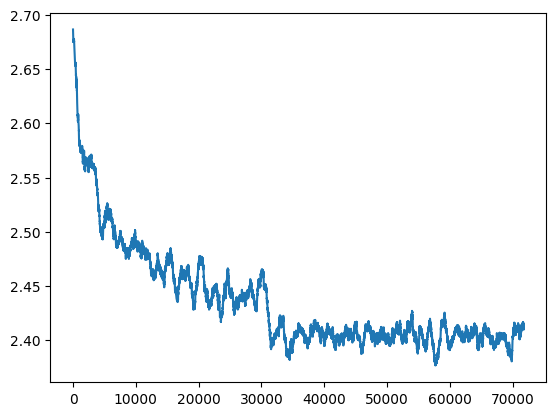

In [29]:
N = 1000
plt.plot(np.convolve(train_loss, np.ones(N)/N, mode='valid'))
print(paramaters)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


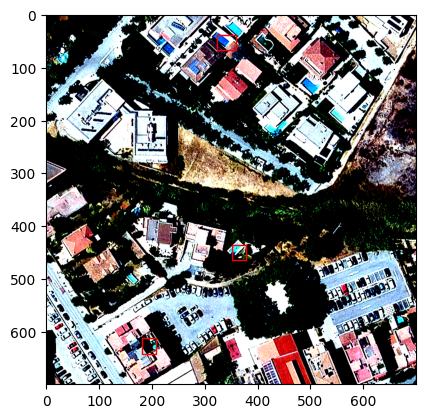

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5


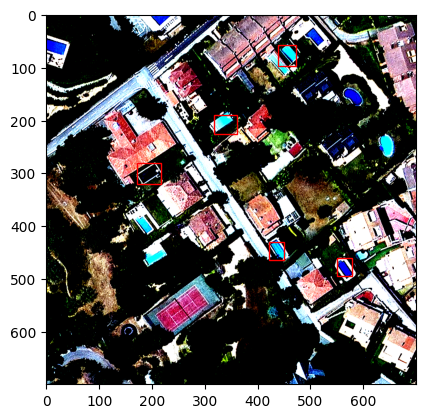

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5


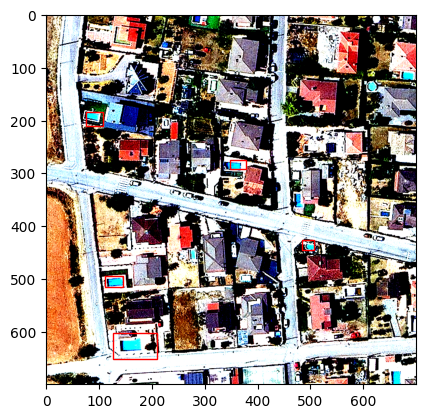

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


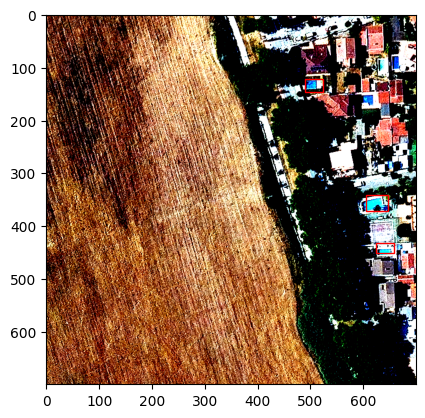

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


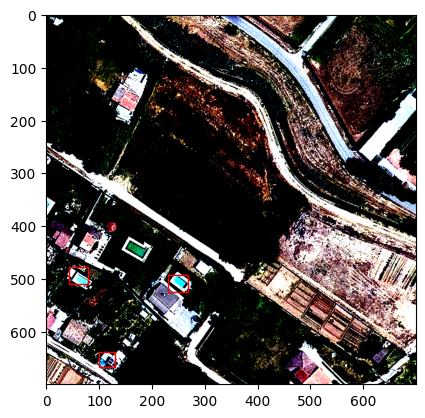

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6


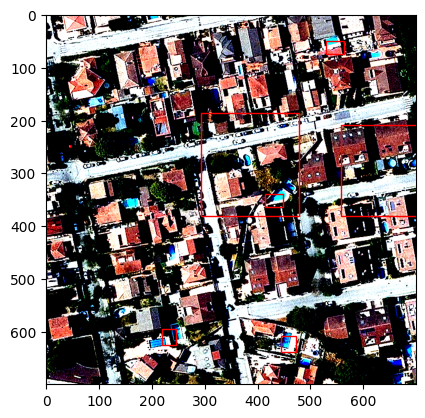

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


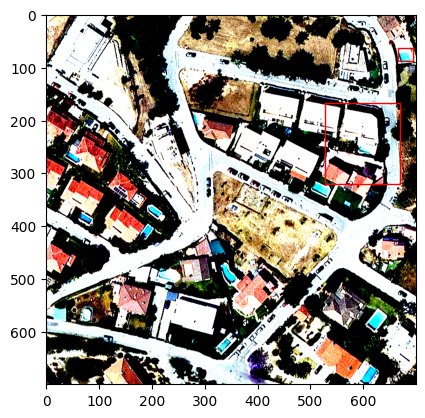

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


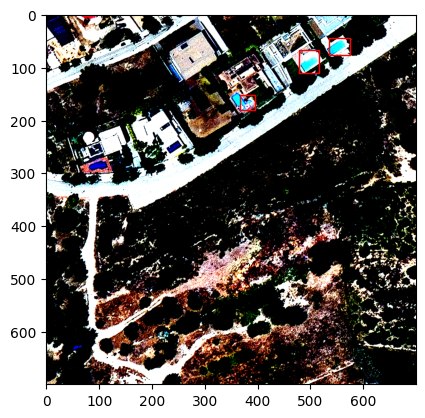

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


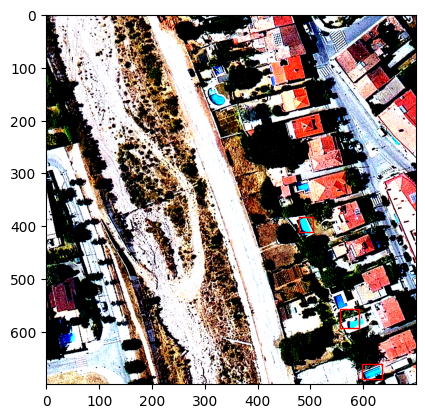

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


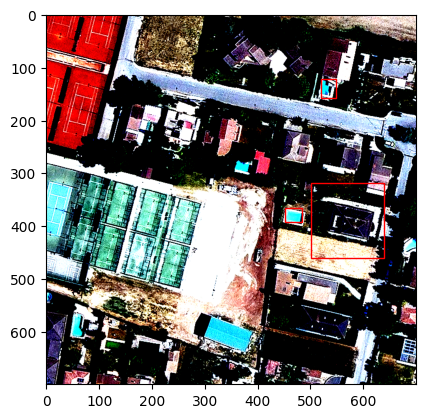

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3


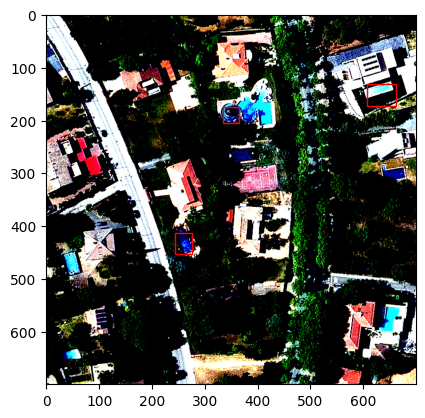

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2


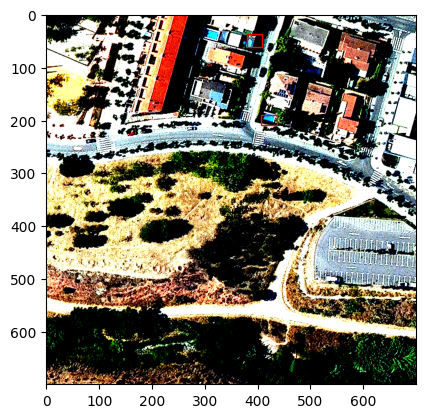

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4


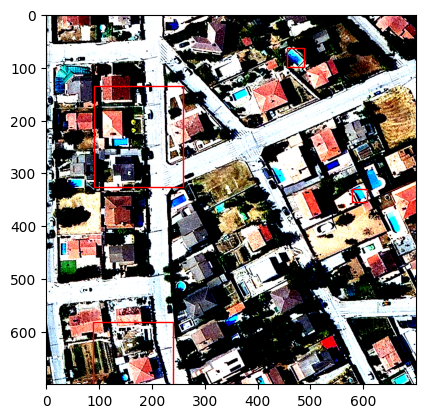

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1


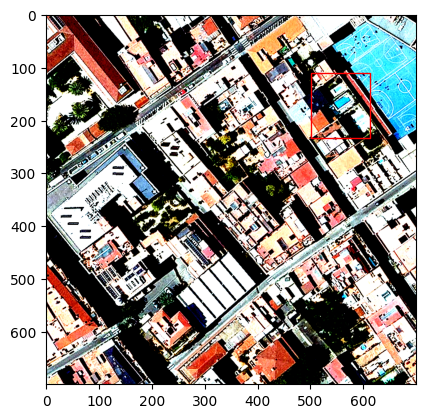

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8


KeyboardInterrupt: 

In [36]:
threshold = 0.8

for images, targets in data_loader_train:
    images = [image.to(device) for image in images]
    targets = [{k: v for k, v in t.items()} for t in targets]
    output = model(images)
    for n in range(len(images)):
        image = images[n].cpu().numpy()
        image = np.moveaxis(image, 0, -1)
        mask = output["pred_logits"][n] > threshold
        mask = torch.cat((mask, mask, mask, mask), 1)
        pred_boxes = cxcywh_to_xywh(output["pred_boxes"][n][mask].reshape(-1, 4))
        if pred_boxes.shape[0] > 0:
            fig, ax = plt.subplots()
            print(pred_boxes.shape[0])
            for bounding_box in pred_boxes:
                x, y, w, h = bounding_box.cpu().detach().numpy()
                x, y, w, h = x*new_size[0], y*new_size[1], w*new_size[0], h*new_size[1]
                bb = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(bb)
            ax.imshow(image)
            plt.show()

In [104]:
model = PoolDetectionModel(1)
model.to(device)
model.train()
model.zero_grad()
for images, targets in data_loader_train:
    images = [image.to(device) for image in images]
    output = model(images)
    loss = output["pred_boxes"].sum()
#     print(loss.is_leaf)
#     loss.backward(retain_graph=True)
    make_dot(loss, params=dict(model.named_parameters()), show_attrs=True, show_saved=True).render('graph', format='pdf', directory='/tf')
    break

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


In [37]:
output

{'pred_logits': tensor([[[1.2079e-02],
          [3.1535e-01],
          [3.7834e-03],
          [1.6707e-01],
          [5.0073e-02],
          [1.0228e-03],
          [2.2512e-02],
          [4.5675e-04],
          [1.5446e-01],
          [7.3926e-02],
          [7.4687e-03],
          [2.0643e-03],
          [4.7489e-02],
          [1.4267e-02],
          [2.3466e-01],
          [5.8750e-03],
          [1.6315e-01],
          [3.5857e-01],
          [2.2036e-01],
          [1.2897e-02],
          [1.2724e-03],
          [6.9852e-03],
          [3.4959e-03],
          [3.8335e-03],
          [6.1180e-01],
          [4.3886e-03],
          [1.4050e-01],
          [7.6856e-01],
          [9.9445e-02],
          [1.4078e-02],
          [2.8928e-02],
          [1.4162e-03],
          [5.6288e-03],
          [1.3682e-01],
          [5.3283e-05],
          [4.9302e-01],
          [3.0444e-02],
          [3.5177e-01],
          [1.2896e-01],
          [1.0912e-01],
          [3.9406e-02],
 

In [32]:
import shutil
for i in [86, 85]:
    shutil.rmtree("/tf/data/tmp/PoolsDS/tests/test "+str(i))